This notebook is a work in progress and further developments and exploration are planned. 

See last chapter for future aditions to this notebook.

# Import Packages

In [1]:
import numpy as np
import pandas as pd
from collections import Counter
from nltk import ngrams, FreqDist
from nltk import ngrams, FreqDist
from scipy import stats
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.model_selection import KFold, train_test_split, RandomizedSearchCV, GridSearchCV
from category_encoders.leave_one_out import LeaveOneOutEncoder 
from category_encoders.one_hot import OneHotEncoder
from sklearn.linear_model import LinearRegression, Lasso, Ridge, LassoCV, RidgeCV, ElasticNetCV
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import mutual_info_regression
from xgboost import XGBRegressor

#Custom made functions
from cml_functions import subplot_hyperparameter, perform_tuning

from pprint import pprint
from scipy import stats

SEED = 101
pd.options.display.max_columns = None
pd.set_option("display.max_rows", None)

# Run Pre-Processing Script on Raw Data

In [2]:
#Call a script that pre-processes data for CML Auctions
%run -i "cml_pre_process_data.py"

2020-10-17 15:46:05 INFO: Downloading default packages for language: pt (Portuguese)...
2020-10-17 15:46:05 INFO: File exists: C:\Users\miguel.almas\stanza_resources\pt\default.zip.
2020-10-17 15:46:07 INFO: Finished downloading models and saved to C:\Users\miguel.almas\stanza_resources.
2020-10-17 15:46:07 INFO: Loading these models for language: pt (Portuguese):
| Processor | Package |
-----------------------
| tokenize  | bosque  |
| lemma     | bosque  |

2020-10-17 15:46:08 INFO: Use device: gpu
2020-10-17 15:46:08 INFO: Loading: tokenize
2020-10-17 15:46:11 INFO: Loading: lemma
2020-10-17 15:46:11 INFO: Done loading processors!
C:\Users\miguel.almas\Downloads\Portuguese-Art-Auction-Prices\cml_functions.py:212: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view

In [3]:
df_cml.head()

,Auction Number,Artwork Number,Title,Technique,Dimensions,Estimated Price,Date of Auction End,Sale Price,Image URL,Number of Authors,1 Author,2 Author,3 Author,1 Author Birth,1 Author Death,2 Author Birth,2 Author Death,3 Author Birth,3 Author Death,Technique Tokenized,Technique Lemmatized,Dim 1,Dim 2,Dim 3,Dimension List,Number of Dimensions,Dimension Units,Number of Artworks,Year,Month,Day,Day of Week,Hour,Sold,Final Price
0,1222,1,Sem título,"par de tecnicas mistas sobre papel, assinadas",Dim. - 28 x 37 cm,40,2020-02-02 21:00:00,60,https://leiloescml-aclserviatildese.netdna-ssl...,1,horta e costa,none,none,1953,no information,no information,no information,no information,no information,par+tecnicas+mistas+papel+assinadas,par+tecnica+mista+papel+assinar,28,37,NaN,"[28, 37]",2,cm,2,2020,2,2,Sunday,21,1,60
1,1222,2,"""Arco da Rua Augusta""","oleo sobre tela, assinado barros e datado de 2000",Dim. - 60 x 50 cm,300,2020-02-02 21:00:15,Not sold,https://leiloescml-aclserviatildese.netdna-ssl...,1,no information,none,none,no information,no information,no information,no information,no information,no information,oleo+tela+assinado+barros+datado,oleo+tela+assinar+barro+datar,60,50,NaN,"[60, 50]",2,cm,1,2020,2,2,Sunday,21,0,0
2,1222,3,Sem título,"oleo sobre tela, assinado e datado de 1986",Dim. - 100 x 82 cm,300,2020-02-02 21:03:26,400,https://leiloescml-aclserviatildese.netdna-ssl...,1,rui cunha,none,none,1942,no information,no information,no information,no information,no information,oleo+tela+assinado+datado,oleo+tela+assinar+datar,100,82,NaN,"[100, 82]",2,cm,1,2020,2,2,Sunday,21,1,400
3,1222,4,"""Coimbra""","oleo sobre platex, assinado",Dim. - 40 x 50 cm,150,2020-02-02 21:03:47,600,https://leiloescml-aclserviatildese.netdna-ssl...,1,pedro olayo filho,none,none,1930,no information,no information,no information,no information,no information,oleo+platex+assinado,oleo+platex+assinar,40,50,NaN,"[40, 50]",2,cm,1,2020,2,2,Sunday,21,1,600
4,1222,5,"""Trecho de Coimbra""","oleo sobre platex, assinado",Dim. - 59 x 49 cm,180,2020-02-02 21:01:00,375,https://leiloescml-aclserviatildese.netdna-ssl...,1,pedro olayo filho,none,none,1930,no information,no information,no information,no information,no information,oleo+platex+assinado,oleo+platex+assinar,59,49,NaN,"[59, 49]",2,cm,1,2020,2,2,Sunday,21,1,375


# Import Data

In [4]:
df_cml = pd.read_csv('.\cleaned_data\cleaned_df_cml.csv',index_col=0)

In [5]:
df_cml.head()

,Auction Number,Artwork Number,Title,Technique,Dimensions,Estimated Price,Date of Auction End,Sale Price,Image URL,Number of Authors,1 Author,2 Author,3 Author,1 Author Birth,1 Author Death,2 Author Birth,2 Author Death,3 Author Birth,3 Author Death,Technique Tokenized,Technique Lemmatized,Dim 1,Dim 2,Dim 3,Dimension List,Number of Dimensions,Dimension Units,Number of Artworks,Year,Month,Day,Day of Week,Hour,Sold,Final Price
0,1222,1,Sem título,"par de tecnicas mistas sobre papel, assinadas",Dim. - 28 x 37 cm,40,2020-02-02 21:00:00,60,https://leiloescml-aclserviatildese.netdna-ssl...,1,horta e costa,none,none,1953,no information,no information,no information,no information,no information,par+tecnicas+mistas+papel+assinadas,par+tecnica+mista+papel+assinar,28,37.0,NaN,"['28', '37']",2,cm,2,2020,2,2,Sunday,21,1,60
1,1222,2,"""Arco da Rua Augusta""","oleo sobre tela, assinado barros e datado de 2000",Dim. - 60 x 50 cm,300,2020-02-02 21:00:15,Not sold,https://leiloescml-aclserviatildese.netdna-ssl...,1,no information,none,none,no information,no information,no information,no information,no information,no information,oleo+tela+assinado+barros+datado,oleo+tela+assinar+barro+datar,60,50.0,NaN,"['60', '50']",2,cm,1,2020,2,2,Sunday,21,0,0
2,1222,3,Sem título,"oleo sobre tela, assinado e datado de 1986",Dim. - 100 x 82 cm,300,2020-02-02 21:03:26,400,https://leiloescml-aclserviatildese.netdna-ssl...,1,rui cunha,none,none,1942,no information,no information,no information,no information,no information,oleo+tela+assinado+datado,oleo+tela+assinar+datar,100,82.0,NaN,"['100', '82']",2,cm,1,2020,2,2,Sunday,21,1,400
3,1222,4,"""Coimbra""","oleo sobre platex, assinado",Dim. - 40 x 50 cm,150,2020-02-02 21:03:47,600,https://leiloescml-aclserviatildese.netdna-ssl...,1,pedro olayo filho,none,none,1930,no information,no information,no information,no information,no information,oleo+platex+assinado,oleo+platex+assinar,40,50.0,NaN,"['40', '50']",2,cm,1,2020,2,2,Sunday,21,1,600
4,1222,5,"""Trecho de Coimbra""","oleo sobre platex, assinado",Dim. - 59 x 49 cm,180,2020-02-02 21:01:00,375,https://leiloescml-aclserviatildese.netdna-ssl...,1,pedro olayo filho,none,none,1930,no information,no information,no information,no information,no information,oleo+platex+assinado,oleo+platex+assinar,59,49.0,NaN,"['59', '49']",2,cm,1,2020,2,2,Sunday,21,1,375


In [6]:
df_cml.columns

Index(['Auction Number', 'Artwork Number', 'Title', 'Technique', 'Dimensions',
       'Estimated Price', 'Date of Auction End', 'Sale Price', 'Image URL',
       'Number of Authors', '1 Author', '2 Author', '3 Author',
       '1 Author Birth', '1 Author Death', '2 Author Birth', '2 Author Death',
       '3 Author Birth', '3 Author Death', 'Technique Tokenized',
       'Technique Lemmatized', 'Dim 1', 'Dim 2', 'Dim 3', 'Dimension List',
       'Number of Dimensions', 'Dimension Units', 'Number of Artworks', 'Year',
       'Month', 'Day', 'Day of Week', 'Hour', 'Sold', 'Final Price'],
      dtype='object')

# Exploratory Data Analyis and Visualization

In [7]:
print('{:.2f}% of artworks are sold.'.format(df_cml['Sold'].mean()*100))

60.16% of artworks are sold.


## Distribution of Final Price

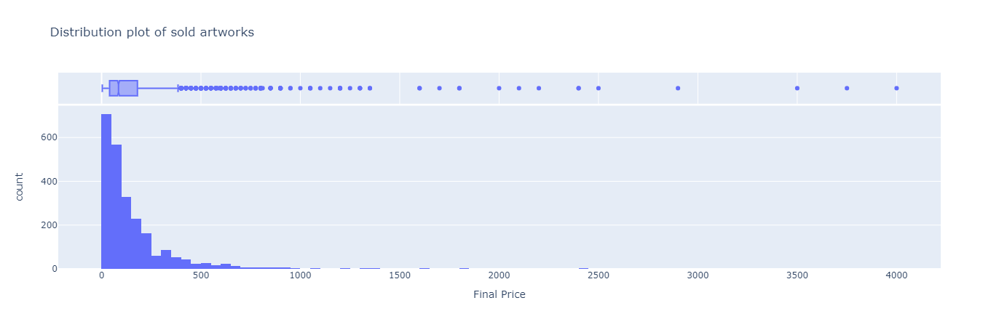

In [8]:
#Let's check a simple distribution plot of the Final Sale Price
fig = px.histogram(df_cml[df_cml['Sold'] == 1], x="Final Price", marginal="box", # or violin, rug
                   hover_data=df_cml.columns,title='Distribution plot of sold artworks')
fig.show()

We can see that most artworks sell for relatively little, the median is 85€ and most are contained within 385€ price range. Some high price sales exist but are quite rare. Maximum price detected of a single artwork is 4000€!

Distribution is highly right (positive) skewed. Some transformation may be beneficial.

## Artist

The artist is probably one of the most important factors in artwork pricing. So let's explore this vector!

In [9]:
#Let's list number of artworks to which an author contributes.
set_of_names = set(df_cml['1 Author'].tolist()+df_cml['2 Author'].tolist()+df_cml['3 Author'].tolist())
len(set_of_names)

715

Let's check the number of sold and unsold artworks first. 

In [10]:
filt = df_cml['1 Author'] != 'no information'
df_sale_record_artist = df_cml[filt].groupby('1 Author')['Sold'].agg(number_of_auctions='count',
                                                            number_of_sold_artworks='sum',
                                                            number_of_unsold_artworks=lambda x: x.count()-x.sum(),
                                                           sale_rate='mean').sort_values('number_of_auctions',ascending=False)
df_sale_record_artist.head()

,number_of_auctions,number_of_sold_artworks,number_of_unsold_artworks,sale_rate
1 Author,,,,
cruzeiro seixas,50,43,7,0.860000
júlio pomar,50,40,10,0.800000
josé de guimarães,42,40,2,0.952381
manuel cargaleiro,39,39,0,1.000000
bartolomeu cid dos santos,38,31,7,0.815789


In [11]:
filt = df_cml['2 Author'] != 'no information'
df_sale_record_artist = df_cml[filt].groupby('2 Author')['Sold'].agg(number_of_auctions='count',
                                                            number_of_sold_artworks='sum',
                                                            number_of_unsold_artworks=lambda x: x.count()-x.sum(),
                                                           sale_rate='mean').sort_values('number_of_auctions',ascending=False)
df_sale_record_artist.head()

,number_of_auctions,number_of_sold_artworks,number_of_unsold_artworks,sale_rate
2 Author,,,,
none,3984,2394,1590,0.600904
rodrigo cabral,4,4,0,1.000000
alfredo luz,2,2,0,1.000000
mário cesariny,1,1,0,1.000000


In [12]:
filt = df_cml['3 Author'] != 'no information'
df_sale_record_artist = df_cml[filt].groupby('3 Author')['Sold'].agg(number_of_auctions='count',
                                                            number_of_sold_artworks='sum',
                                                            number_of_unsold_artworks=lambda x: x.count()-x.sum(),
                                                           sale_rate='mean').sort_values('number_of_auctions',ascending=False)
df_sale_record_artist.head()

,number_of_auctions,number_of_sold_artworks,number_of_unsold_artworks,sale_rate
3 Author,,,,
none,3990,2400,1590,0.601504
mário henrique leiria,1,1,0,1.000000


We can see that very little cases with 2 or 3 authors exist. Therefore these will be ignored (same goes with 2 and 3 Author Birth and Death Dates/Decade).

### Number of sold and unsold artworks per author

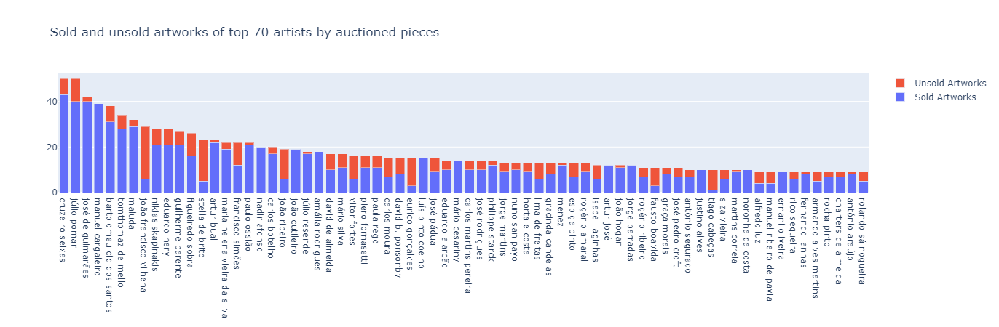

In [13]:
filt = df_cml['1 Author'] != 'no information'
df_sale_record_artist = df_cml[filt].groupby('1 Author')['Sold'].agg(number_of_auctions='count',
                                                            number_of_sold_artworks='sum',
                                                            number_of_unsold_artworks=lambda x: x.count()-x.sum(),
                                                           sale_rate='mean').sort_values('number_of_auctions',ascending=False)

fig = go.Figure(data=[
    go.Bar(name='Sold Artworks', x=df_sale_record_artist[:70].index, y=df_sale_record_artist[:70]['number_of_sold_artworks']),
    go.Bar(name='Unsold Artworks', x=df_sale_record_artist[:70].index, y=df_sale_record_artist[:70]['number_of_unsold_artworks'])
])
# Change the bar mode
fig.update_layout(barmode='stack',title='Sold and unsold artworks of top 70 artists by auctioned pieces')
fig.show()

### Final Sale Prices of Artworks

In [14]:
#First, let's reoder the dataframe so that the same order of the previous graphs (from artist with most auctions to the one with the lowest)
df_cml['Temp'] = pd.CategoricalIndex(df_cml['1 Author'], ordered=True, categories=df_sale_record_artist.index)
df_cml_sorted = df_cml.sort_values('Temp',ascending=True)

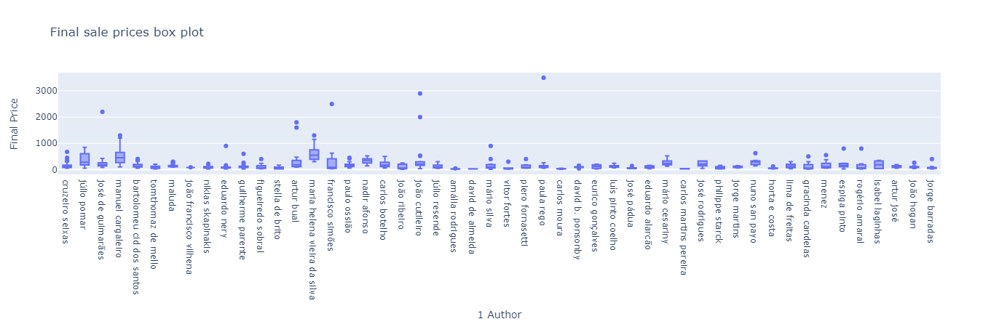

In [15]:
#Create graph
filt = (df_cml_sorted['1 Author'].isin(df_sale_record_artist[:50].index)) & (df_cml_sorted['Sold'] == 1)
fig = px.box(df_cml_sorted[filt], x="1 Author", y="Final Price",title='Final sale prices box plot')
fig.show()

### Estimated Sale Prices by author

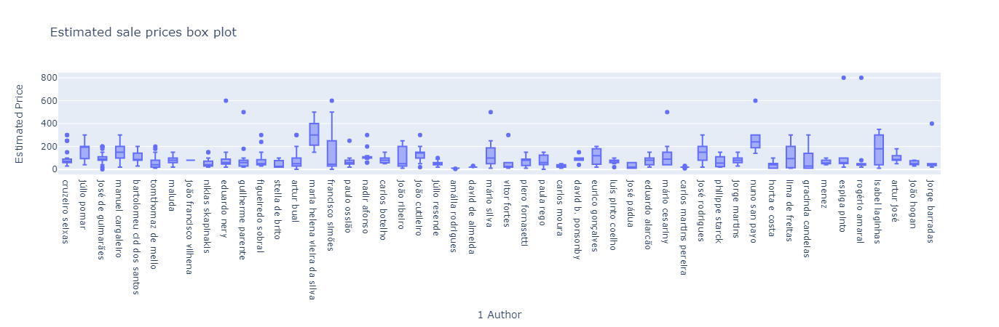

In [16]:
#Create graph
filt = (df_cml_sorted['1 Author'].isin(df_sale_record_artist[:50].index)) & (df_cml_sorted['Sold'] == 1)
fig = px.box(df_cml_sorted[filt], x="1 Author", y="Estimated Price",title='Estimated sale prices box plot')
fig.show()

### Artists with largest differences between estimated and final sale prices.

In [17]:
df_cml_sorted['Price Gap'] = df_cml_sorted[filt]['Final Price'] - df_cml_sorted[filt]['Estimated Price']

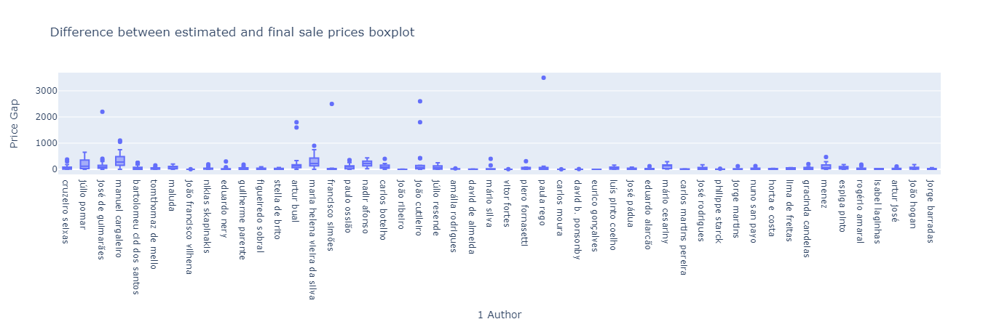

In [18]:
#Create graph
filt = (df_cml_sorted['1 Author'].isin(df_sale_record_artist[:50].index)) & (df_cml_sorted['Sold'] == 1)
fig = px.box(df_cml_sorted[filt], x="1 Author", y="Price Gap",title='Difference between estimated and final sale prices boxplot')
fig.show()

### Boxplots of final sale prices and price gap

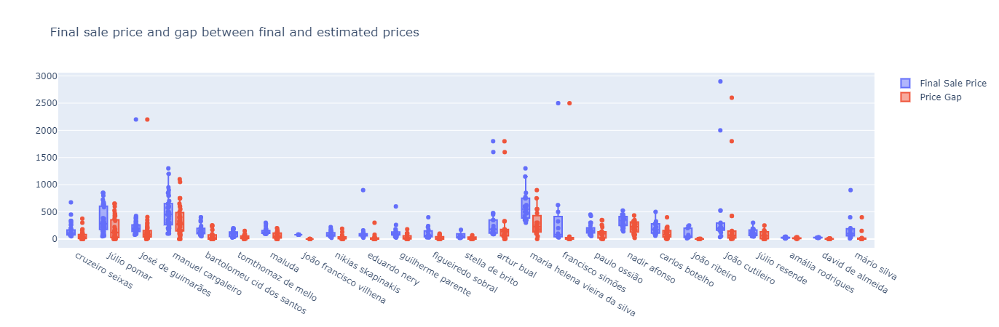

In [19]:
filt = (df_cml_sorted['1 Author'].isin(df_sale_record_artist[:25].index)) & (df_cml_sorted['Sold'] == 1)
fig = go.Figure(data=[
    go.Box(name='Final Sale Price', x=df_cml_sorted[filt]["1 Author"], y=df_cml_sorted[filt]["Final Price"],boxpoints='all',jitter=0.3,pointpos=0),
    go.Box(name='Price Gap', x=df_cml_sorted[filt]["1 Author"], y=df_cml_sorted[filt]["Price Gap"],boxpoints='all',jitter=0.3,pointpos=0)
])
# Change the bar mode
fig.update_layout(boxmode='group',title='Final sale price and gap between final and estimated prices')
fig.show()

### Number of artworks by year of birth of artist

Which "generations" are responsible for more artworks? We can investigate this using decades of birth and checking number of sold and unsold artworks.

In [20]:
df_cml['1 Author'].unique()
year_decade_map = {}
first_year=1800
first_decade = 1800
for i in range(23):
    for j in range(10):
        year_decade_map[str(first_year)] = str(first_decade)+'-'+str(first_decade+10)
        first_year +=1
    first_decade +=10
    
#Add the non year dates to the dictionary:
non_date_years = df_cml['1 Author Birth'][~df_cml['1 Author Birth'].isin(year_decade_map.keys())].unique()
for i in non_date_years:
    year_decade_map[i] = i
df_cml['1 Author Birth Decade'] = df_cml['1 Author Birth'].map(year_decade_map)
df_cml['1 Author Death Decade'] = df_cml['1 Author Death'].map(year_decade_map)

#Let's group years into decades.
df_sale_year_of_birth = df_cml.groupby('1 Author Birth Decade')['Sold'].agg(number_of_auctions='count',
                                                            number_of_sold_artworks='sum',
                                                            number_of_unsold_artworks=lambda x: x.count()-x.sum(),
                                                           sale_rate='mean')
df_sale_year_of_birth.head()

,number_of_auctions,number_of_sold_artworks,number_of_unsold_artworks,sale_rate
1 Author Birth Decade,,,,
1840-1850,3,3,0,1.000000
1860-1870,2,0,2,0.000000
1870-1880,3,2,1,0.666667
1880-1890,30,22,8,0.733333
1890-1900,55,48,7,0.872727


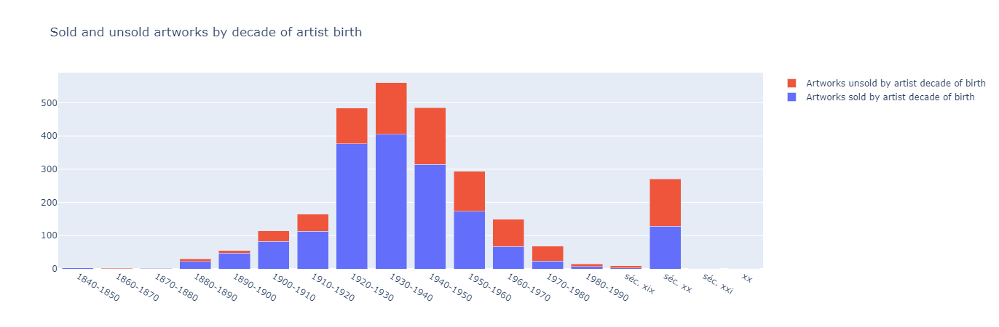

In [21]:
#Let's ignore the "no information cases"
filt = ~df_sale_year_of_birth.index.isin(['no information'])

fig = go.Figure(data=[
    go.Bar(name='Artworks sold by artist decade of birth', x=df_sale_year_of_birth.loc[filt].index, y=df_sale_year_of_birth.loc[filt,'number_of_sold_artworks']),
    go.Bar(name='Artworks unsold by artist decade of birth', x=df_sale_year_of_birth.loc[filt].index, y=df_sale_year_of_birth.loc[filt,'number_of_unsold_artworks'])
])
# Change the bar mode
fig.update_layout(barmode='stack',title='Sold and unsold artworks by decade of artist birth')
fig.show()

These being artworks from artists associated with modern and contemporary art, it's not surprising most correspond to the decades from 1920 onwards. The fact most artworks auctioned are from artists of the 1920-1950s may correspond to the fact that they are established artists and artworks that were sold previously in galleries are now reaching the auction houses.

### Final sale price of artists by decade of birth

In [22]:
#First, let's reoder the dataframe so that the same order of the previous graphs (from oldest to newest decades)
df_cml['Temp'] = pd.CategoricalIndex(df_cml['1 Author Birth Decade'], ordered=True, categories=df_sale_year_of_birth.index)
df_cml_sorted = df_cml.sort_values('Temp',ascending=True)

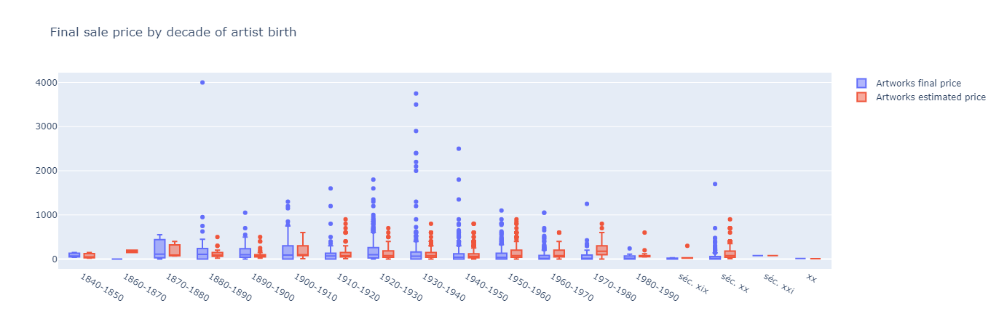

In [23]:
#Let's ignore the "no information cases"
filt = df_cml_sorted['1 Author Birth Decade'] != 'no information'

fig = go.Figure(data=[
    go.Box(name='Artworks final price', x=df_cml_sorted[filt]['1 Author Birth Decade'], y=df_cml_sorted[filt]['Final Price']),
    go.Box(name='Artworks estimated price', x=df_cml_sorted[filt]['1 Author Birth Decade'], y=df_cml_sorted[filt]['Estimated Price'])
])
# Change the bar mode
fig.update_layout(boxmode='group',title='Final sale price by decade of artist birth')
fig.show()

## Artworks by dimensions

No information and NaN will be converted to the median size.

In [24]:
print('There are {:.2f}% of artworks without information regarding Dim 1'.format(((df_cml['Dim 1'] == 'no information') | (df_cml['Dim 1'].isna())).sum() / df_cml.shape[0]*100))

There are 0.98% of artworks without information regarding Dim 1


This is a small %. We can infer these values without much distortion.

In [25]:
print('There are {:.2f}% of artworks without information regarding Dim 2'.format(((df_cml['Dim 2'] == 'no information') | (df_cml['Dim 2'].isna())).sum() / df_cml.shape[0]*100))

There are 13.86% of artworks without information regarding Dim 2


C:\Users\miguel.almas\Miniconda3\lib\site-packages\pandas\core\ops\array_ops.py:253: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



Larger but let's use the same strategy.

In [26]:
#Fill in the missing values
filt = ~((df_cml['Dim 1'] == 'no information') | (df_cml['Dim 1'].isna()))
df_cml['Dim 1'] = df_cml['Dim 1'].fillna(df_cml[filt]['Dim 1'].median()).replace('no information',df_cml[filt]['Dim 1'].median())

filt = ~((df_cml['Dim 2'] == 'no information') | (df_cml['Dim 2'].isna()))
df_cml['Dim 2'] = df_cml['Dim 2'].fillna(df_cml[filt]['Dim 2'].median()).replace('no information',df_cml[filt]['Dim 2'].median())

#Calculating the bidimensional area
df_cml['Area'] = df_cml['Dim 1'].astype('float64') * df_cml['Dim 2'].astype('float64')

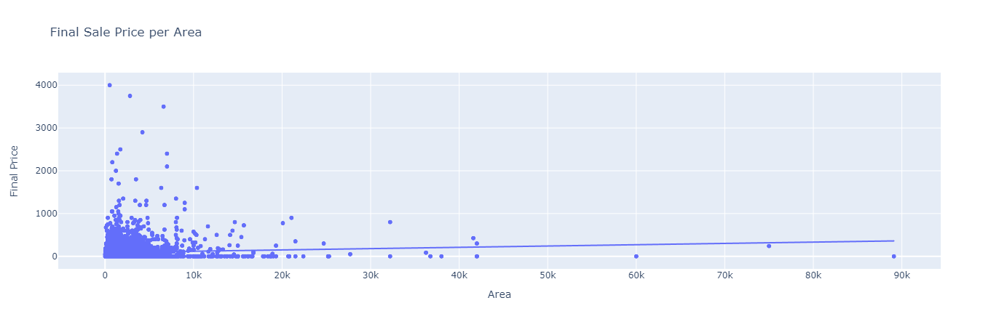

In [27]:
#Scatterplot of area and sale price
fig = px.scatter(data_frame=df_cml,x='Area',y='Final Price',title='Final Sale Price per Area', trendline="ols")
fig.show()

Hmmmmm. There doesn't seem to be a strong relation between area and final sale price...

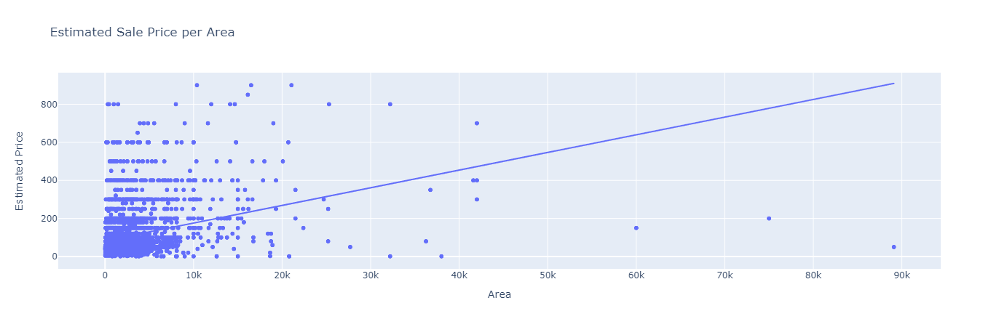

In [28]:
#Scatterplot of area and sale price
fig = px.scatter(data_frame=df_cml,x='Area',y='Estimated Price',title='Estimated Sale Price per Area', trendline="ols")
fig.show()

The graph is hard to read but it seems there is at least some linear relation between Estimated Price and the 2D Area.

### Horizontal vs Vertical vs Square Shape

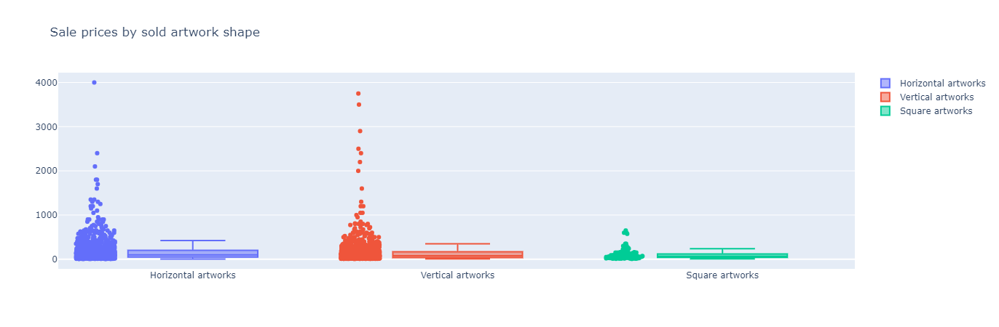

In [29]:
#Get horizontal,vertical and square shaped artworks
filt_horizontal = (df_cml['Dim 1'].astype('float64') > df_cml['Dim 2'].astype('float64')) & (df_cml['Sold'] == 1)
filt_vertical = (df_cml['Dim 2'].astype('float64') > df_cml['Dim 1'].astype('float64')) & (df_cml['Sold'] == 1)
filt_square = (df_cml['Dim 2'].astype('float64') == df_cml['Dim 1'].astype('float64')) & (df_cml['Sold'] == 1)

fig = go.Figure(data=[
    go.Box(name='Horizontal artworks', y=df_cml.loc[filt_horizontal,'Final Price'].values,boxpoints='all',jitter=0.3,pointpos=-1.5),
    go.Box(name='Vertical artworks', y=df_cml.loc[filt_vertical,'Final Price'].values,boxpoints='all',jitter=0.3,pointpos=-1.5),
    go.Box(name='Square artworks', y=df_cml.loc[filt_square,'Final Price'].values,boxpoints='all',jitter=0.3,pointpos=-1.5)
])
# Change the bar mode
fig.update_layout(title='Sale prices by sold artwork shape')
fig.show()

So shape of artworks seems to be an interesting feature!

In [30]:
df_cml['Shape'] = np.nan
df_cml.loc[(df_cml['Dim 1'].astype('float64') > df_cml['Dim 2'].astype('float64')),'Shape'] = 'Horizontal'
df_cml.loc[(df_cml['Dim 1'].astype('float64') < df_cml['Dim 2'].astype('float64')),'Shape'] = 'Vertical'
df_cml.loc[(df_cml['Dim 1'].astype('float64') == df_cml['Dim 2'].astype('float64')),'Shape'] = 'Square'

### Number of Artworks by Shape

In [31]:
df_sale_shape = df_cml.groupby('Shape')['Sold'].agg(number_of_auctions='count',
                                                            number_of_sold_artworks='sum',
                                                            number_of_unsold_artworks=lambda x: x.count()-x.sum(),
                                                           sale_rate='mean')
df_sale_shape

,number_of_auctions,number_of_sold_artworks,number_of_unsold_artworks,sale_rate
Shape,,,,
Horizontal,1912,1180,732,0.617155
Square,228,133,95,0.583333
Vertical,1851,1088,763,0.587790


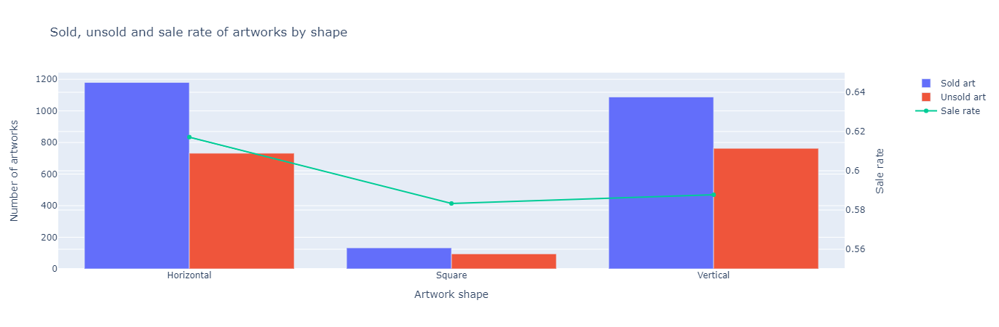

In [32]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
fig.add_trace(
    go.Bar(name='Sold art', x=df_sale_shape.index, y=df_sale_shape['number_of_sold_artworks'],hovertemplate = 'Sold art: %{y:.0f}<extra></extra>'),secondary_y=False
)
fig.add_trace(
    go.Bar(name='Unsold art', x=df_sale_shape.index, y=df_sale_shape['number_of_unsold_artworks'],hovertemplate = 'Unsold art: %{y:.0f}<extra></extra>'),secondary_y=False
)
fig.add_trace(
    go.Scatter(name='Sale rate', x=df_sale_shape.index, y=df_sale_shape['sale_rate'],hovertemplate = 'Sale rate: %{y:.4f}<extra></extra>'),secondary_y=True
)

# Add figure title
fig.update_layout(
    title_text="Sold, unsold and sale rate of artworks by shape"
)

# Set x-axis title
fig.update_xaxes(title_text="Artwork shape")

# Set y-axes titles
fig.update_yaxes(title_text="Number of artworks", secondary_y=False)
fig.update_yaxes(title_text="Sale rate", secondary_y=True)
fig.update_layout(yaxis2 =dict(range=[0.55,0.65]))

fig.show()

### Typical Artwork Area by Artist

In [33]:
#First, let's reoder the dataframe so that the same order of the previous graphs (from artist with most auctions to the one with the lowest)
df_cml['Temp'] = pd.CategoricalIndex(df_cml['1 Author'], ordered=True, categories=df_sale_record_artist.index)
df_cml_sorted = df_cml.sort_values('Temp',ascending=True)

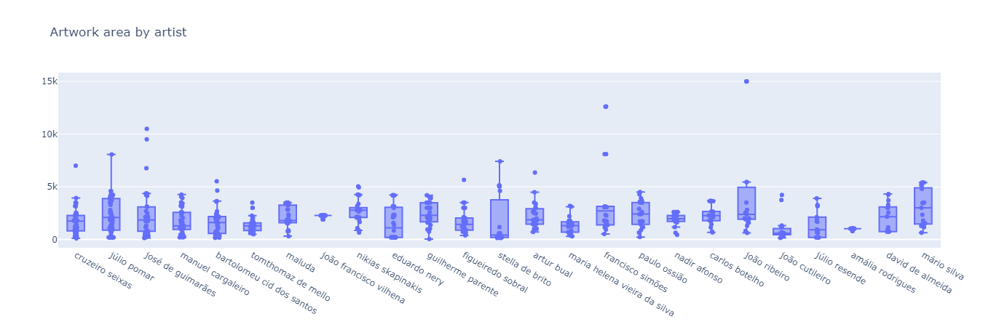

In [34]:
filt = (df_cml_sorted['1 Author'].isin(df_sale_record_artist[:25].index))
fig = go.Figure(data=[
    go.Box(name='Artwork Area', x=df_cml_sorted[filt]["1 Author"], y=df_cml_sorted[filt]["Area"],boxpoints='all',jitter=0.3,pointpos=0),
])
# Change the bar mode
fig.update_layout(boxmode='group',title='Artwork area by artist')
fig.show()

### Artworks by characteristics

## Using Lemmatized words from Technique

Let's get the top 100 most frequent words __without__ Lemmatization

In [35]:
#Set number of terms to capture
n_terms = 100

#word_count_technique - Top 100
word_count = Counter(df_cml['Technique Tokenized'].str.cat(sep='+').split('+')).most_common(n_terms)
#word_count

all_counts_tokenized = dict()
all_counts_tokenized[1] = {tuple_word[0]:tuple_word[1] for tuple_word in word_count}
for size in 2, 3, 4, 5:
    tmp = FreqDist(ngrams([i for i in df_cml['Technique Lemmatized'].astype('str').str.split('+').str.join(' ').apply(lambda x: x+' ').str.cat(sep=' paragrafo ').split(' ') if i not in ['']], size))
    #Exclude the tuples that include 'paragrafo'
    list_tuples = [tuple_words for tuple_words in list(tmp.keys()) if not any(word == 'paragrafo' for word in tuple_words)]
    tmp_dict = {key:tmp[key] for key in list_tuples}
    #Sort the dictionary
    all_counts_tokenized[size] = {k: v for k, v in sorted(tmp_dict.items(), key=lambda item: item[1],reverse=True)}

Let's get the top 100 most frequent words __with__ Lemmatization

In [36]:
#word_count_technique - Top 100
word_count = Counter(df_cml['Technique Lemmatized'].str.cat(sep='+').split('+')).most_common(n_terms)
#word_count

all_counts_lemmatized = dict()
all_counts_lemmatized[1] = {tuple_word[0]:tuple_word[1] for tuple_word in word_count}
for size in 2, 3, 4, 5:
    tmp = FreqDist(ngrams([i for i in df_cml['Technique Lemmatized'].astype('str').str.split('+').str.join(' ').apply(lambda x: x+' ').str.cat(sep=' paragrafo ').split(' ') if i not in ['']], size))
    #Exclude the tuples that include 'paragrafo'
    list_tuples = [tuple_words for tuple_words in list(tmp.keys()) if not any(word == 'paragrafo' for word in tuple_words)]
    tmp_dict = {key:tmp[key] for key in list_tuples}
    #Sort the dictionary
    all_counts_lemmatized[size] = {k: v for k, v in sorted(tmp_dict.items(), key=lambda item: item[1],reverse=True)}

Ok, now we have n grams of the words used on the Technique column! This should help us identify the most important terms and expressions that need to be captured (One Hot Encoded).

Lemmas appear to be mostly well obtained with few exceptions. Regardless we'll test the model's performance with and without lemmatization to gauge it's importance.

Let's OHE the Lemmas!

In [37]:
#OHE the lemma words
for i in list(all_counts_lemmatized[1].keys()):
    df_cml[i] = 0
    df_cml.loc[df_cml['Technique Lemmatized'].astype('str').apply(lambda x: i in x),i] = 1

In [38]:
#Drop the columns "Technique Preprocessd, Tokenized and Lemmatized"
df_cml = df_cml.drop(['Technique Tokenized','Technique Lemmatized'],axis=1).copy() #Technique
df_cml.head()

,Auction Number,Artwork Number,Title,Technique,Dimensions,Estimated Price,Date of Auction End,Sale Price,Image URL,Number of Authors,1 Author,2 Author,3 Author,1 Author Birth,1 Author Death,2 Author Birth,2 Author Death,3 Author Birth,3 Author Death,Dim 1,Dim 2,Dim 3,Dimension List,Number of Dimensions,Dimension Units,Number of Artworks,Year,Month,Day,Day of Week,Hour,Sold,Final Price,Temp,1 Author Birth Decade,1 Author Death Decade,Area,Shape,assinar,papel,datar,numerada,serigrafia,tecnica,marcar,tela,misturar,defeito,pequeno,oleo,sinal,europeu,uso,metal,decoracao,vidro,verso,acrilico,madeira,escultura,identificar,português,gravura,policromada,assinatura,aguarela,tinta,china,fabricar,falta,cromado,italiano,portugue,material,azulejo,platex,mancha,cristal,dourar,"""",autor,pintado,prateado,plastico,prova,hc,relevado,base,humidade,colagem,metade,art,ceramica,deco,cartao,faianca,numerado,edicao,pico,litografia,fotografia,viuvo,lamego,porcelana,moldado,acidez,esbeicadela,france,barro,pastel,negro,tampo,pa,azul,desgaste,mecanismo,modelo,fosco,suporte,estrutura,prato,guache,provavelmente,pintura,bronze,branco,partido,pe,francês,ferro,moldura,alemao,marmore,verde,tecido,:,colada,lisboa
0,1222,1,Sem título,"par de tecnicas mistas sobre papel, assinadas",Dim. - 28 x 37 cm,40,2020-02-02 21:00:00,60,https://leiloescml-aclserviatildese.netdna-ssl...,1,horta e costa,none,none,1953,no information,no information,no information,no information,no information,28,37.0,NaN,"['28', '37']",2,cm,2,2020,2,2,Sunday,21,1,60,horta e costa,1950-1960,no information,1036.0,Vertical,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,1222,2,"""Arco da Rua Augusta""","oleo sobre tela, assinado barros e datado de 2000",Dim. - 60 x 50 cm,300,2020-02-02 21:00:15,Not sold,https://leiloescml-aclserviatildese.netdna-ssl...,1,no information,none,none,no information,no information,no information,no information,no information,no information,60,50.0,NaN,"['60', '50']",2,cm,1,2020,2,2,Sunday,21,0,0,NaN,no information,no information,3000.0,Horizontal,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1222,3,Sem título,"oleo sobre tela, assinado e datado de 1986",Dim. - 100 x 82 cm,300,2020-02-02 21:03:26,400,https://leiloescml-aclserviatildese.netdna-ssl...,1,rui cunha,none,none,1942,no information,no information,no information,no information,no information,100,82.0,NaN,"['100', '82']",2,cm,1,2020,2,2,Sunday,21,1,400,rui cunha,1940-1950,no information,8200.0,Horizontal,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1222,4,"""Coimbra""","oleo sobre platex, assinado",Dim. - 40 x 50 cm,150,2020-02-02 21:03:47,600,https://leiloescml-aclserviatildese.netdna-ssl...,1,pedro olayo filho,none,none,1930,no information,no information,no information,no information,no information,40,50.0,NaN,"['40', '50']",2,cm,1,2020,2,2,Sunday,21,1,600,pedro olayo filho,1930-1940,no information,2000.0,Vertical,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1222,5,"""Trecho de Coimbra""","oleo sobre platex, assinado",Dim. - 59 x 49 cm,180,2020-02-02 21:01:00,375,https://leiloescml-aclserviatildese.netdna-ssl...,1,pedro olayo filho,none,none,1930,no information,no information,no information,no information,no information,59,49.0,NaN,"['59', '49']",2,cm,1,2020,2,2,Sunday,21,1,375,pedro olayo filho,1930-1940,no information,2891.0,Horizontal,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

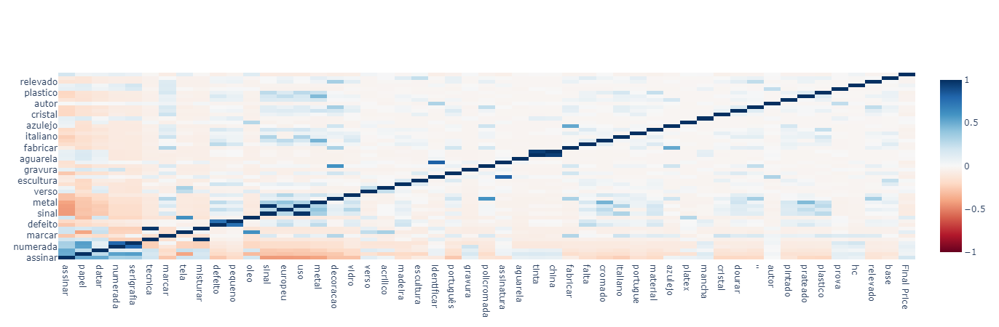

In [39]:
list_techniques = list(all_counts_lemmatized[1].keys())

#There are way to many characteristics to easily plot... But let's try to gauge it's relation with Final Price with a Heatmap (To simplify its reading, let's plot 50 characteristics at a time!
grid_corr = df_cml[list_techniques[:50]+['Final Price']].corr()

fig = go.Figure(data=go.Heatmap(
    z=grid_corr,
    x=grid_corr.index,
    y=grid_corr.columns,
    hoverongaps = False,
    colorscale='RdBu',
    zmin = -1,
    zmax = 1))

fig.show()

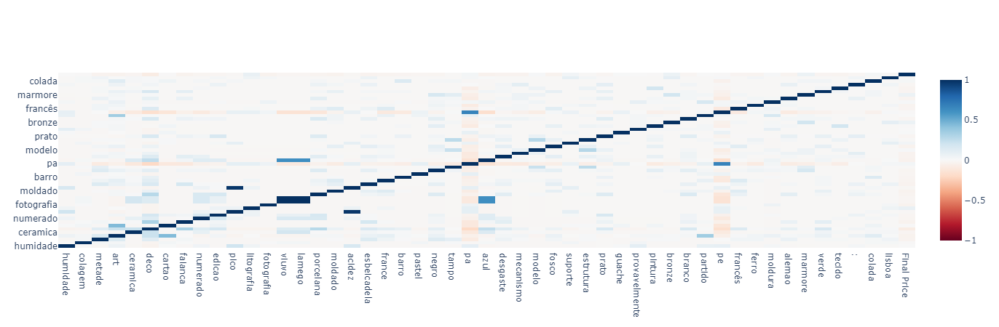

In [40]:
#There are way to many characteristics to easily plot... But let's try to gauge it's relation with Final Price with a Heatmap (To simplify its reading, let's plot 50 characteristics at a time!
grid_corr = df_cml[list_techniques[50:100]+['Final Price']].corr()

fig = go.Figure(data=go.Heatmap(
    z=grid_corr,
    x=grid_corr.index,
    y=grid_corr.columns,
    hoverongaps = False,
    colorscale='RdBu',
    zmin = -1,
    zmax = 1))

fig.show()

Unfortunately it doesn't seem that there are strong correlations between characteristics and the Final Price... 

### Artwork sales timeseries

In [41]:
df_cml['Date of Auction End'] = pd.to_datetime(df_cml['Date of Auction End']).dt.date

In [42]:
df_sale_by_day = df_cml.groupby(['Date of Auction End'])['Sold'].agg(number_of_auctions='count',
                                                            number_of_sold_artworks='sum',
                                                            number_of_unsold_artworks=lambda x: x.count()-x.sum(),
                                                           sale_rate='mean')
df_sale_by_day

,number_of_auctions,number_of_sold_artworks,number_of_unsold_artworks,sale_rate
Date of Auction End,,,,
2017-02-05,188,110,78,0.585106
2017-04-23,209,117,92,0.559809
2017-06-25,187,77,110,0.411765
2017-09-10,286,144,142,0.503497
2017-12-17,256,129,127,0.503906
2018-03-11,1,1,0,1.000000
2018-03-19,279,137,142,0.491039
2018-05-20,249,113,136,0.453815
2018-09-17,300,149,151,0.496667


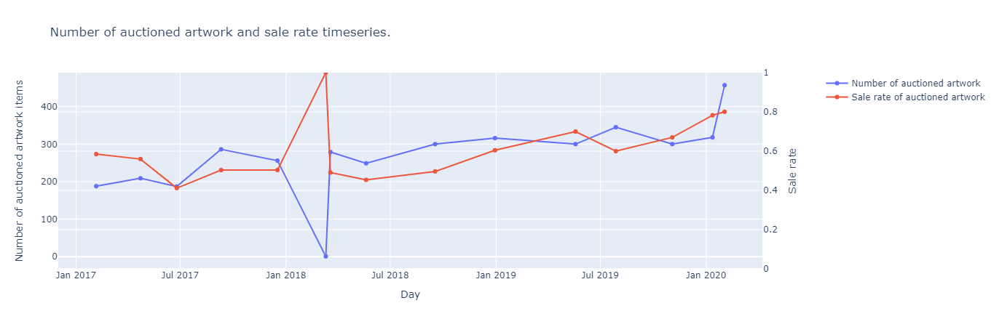

In [43]:
# Create figure with secondary y-axis
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(name='Number of auctioned artwork', x=df_sale_by_day.index, y=df_sale_by_day['number_of_auctions'],hovertemplate = 'Number of artworks: %{y:.0f}<extra></extra>'),secondary_y=False,
)
fig.add_trace(
    go.Scatter(name='Sale rate of auctioned artwork', x=df_sale_by_day.index, y=df_sale_by_day['sale_rate'],hovertemplate = 'Sale rate: %{y:.4f}<extra></extra>'),secondary_y=True,
)


# Add figure title
fig.update_layout(
    title_text="Number of auctioned artwork and sale rate timeseries."
)

# Set x-axis title
fig.update_xaxes(title_text="Day")

# Set y-axes titles
fig.update_yaxes(title_text="Number of auctioned artwork items", secondary_y=False)
fig.update_yaxes(title_text="Sale rate", secondary_y=True)
fig.update_layout(yaxis2 =dict(range=[0,1]))
fig.update_layout(hovermode="x unified")

fig.show()

### Year

In [44]:
df_cml.groupby('Year')['Final Price'].median()

Year
2017    10
2018    12
2019    50
2020    60
Name: Final Price, dtype: int64

Year seems to be an interesting feature in that the larger the year, the larger the median final sale price.

# Preparing Data

In [45]:
df_cml['Dimension Units'].unique()

array(['cm', 'no information'], dtype=object)

## Transformation of Target Variable

In [46]:
#0 values exist in the data. We cannot transform them as is. Let's ignore them on the transformation
filt = df_cml['Sold'] == 1
df_cml['Normalized Final Price'] = 0

df_cml.loc[filt,'Normalized Final Price'] = stats.boxcox(df_cml[filt]['Final Price'])[0]
print(df_cml['Normalized Final Price'].skew())

df_cml.loc[filt,'Normalized Final Price'] = np.log(df_cml[filt]['Final Price'])
print(df_cml['Normalized Final Price'].skew())

-0.14037430488922428
-0.04937445710870825


So it seems the Log transformation yields almost no skewness in the data.

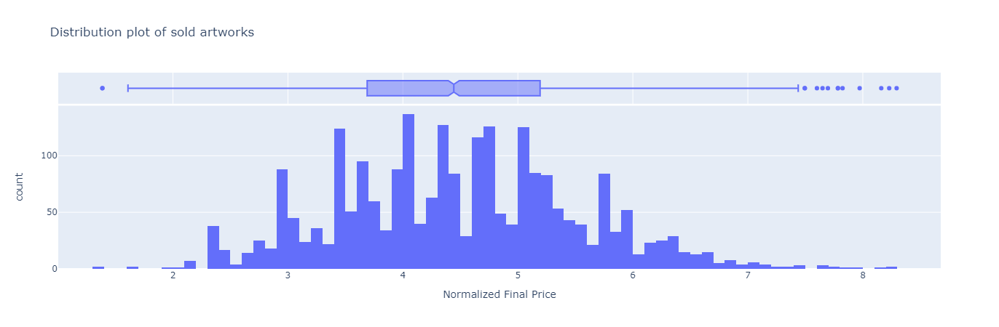

In [47]:
#Let's check a simple distribution plot of the Final Sale Price
fig = px.histogram(df_cml[df_cml['Sold'] == 1], x="Normalized Final Price", marginal="box", # or violin, rug
                   hover_data=df_cml.columns,title='Distribution plot of sold artworks')
fig.show()

In [48]:
log_transform = True

if log_transform:
    #Replace column and drop
    df_cml['Final Price'] = df_cml['Normalized Final Price']

## Drop unsold art from data

Unsold data presents a problem as we do not know how much it would be worth, all we know is that is was less than the minimum bid, which we also do not have...

So as to not force the model to try and predict values of 0, let's drop these from the dataset.

In [49]:
#Drop all unsold atworks from the dataset
df_cml_unsold = df_cml[df_cml['Sold'] == 0].copy()
df_cml = df_cml[df_cml['Sold'] == 1]

## Normalization

## Train/Validation/Test splits

Let's split the dataset into folds for future cross-validation.

In [50]:
#First let's reserve 20% of our data for a test set.
df_train, df_test = train_test_split(df_cml,test_size=0.2,random_state=SEED,shuffle=True)

#Let's preserve the proportion of Sold and Unsold Artwork on each fold.
target_col = 'Final Price'
n_folds = 5

skf = KFold(n_splits=n_folds,random_state=SEED,shuffle=True)
skf.get_n_splits(df_train.drop(target_col,axis=1), df_train[target_col])

list_train_idx = []
list_test_idx = []

for train_index, test_index in skf.split(df_train.drop(target_col,axis=1), df_train[target_col]):
    list_train_idx.append(train_index)
    list_test_idx.append(test_index)

#Set the real target - Final Price
target_col = 'Final Price'

## OHE features

In [51]:
list_features_ohe = ['Shape','1 Author Birth Decade','1 Author Death Decade','Year']

#Let's OHE the features
encoder = OneHotEncoder(cols=list_features_ohe,use_cat_names=True).fit(df_train)
df_train = encoder.transform(df_train)
df_test = encoder.transform(df_test)
df_cml_unsold = encoder.transform(df_cml_unsold)

## Leave-one-out median encoding

When doing Leave-one-out encoding we must be careful to not cause data leakage. We will use the train/test splits to generate the datasets for train/test and apply leave-one-out encoding to those considering only data on the train set.

In [52]:
list_features_mean_encoding = ['1 Author']

#Generate the train/test sets
list_train_sets = [df_train.iloc[i].copy() for i in list_train_idx]
list_test_sets = [df_train.iloc[i].copy() for i in list_test_idx]

#Apply Leave one out encoding
for col in list_features_mean_encoding: 
    col_name = col+'_mean_encoded'
    df_train[col_name] = np.nan
    for i in range(len(list_train_sets)):
        #Fit encoder
        encoder = LeaveOneOutEncoder(cols = list_features_mean_encoding,random_state=SEED).fit(list_train_sets[i].drop(target_col,axis=1),list_train_sets[i][target_col])
        #Apply encoder on test split
        tmp = list_test_sets[i][target_col]
        list_test_sets[i] = encoder.transform(list_test_sets[i].drop(target_col,axis=1))
        list_test_sets[i]['Final Price'] = tmp   
        #Load the mean encodings into the Dataframe
        df_train.loc[list_test_sets[i].index,col_name] = list_test_sets[i][col]
    
    tmp = df_cml_unsold[target_col]
    df_cml_unsold = encoder.transform(df_cml_unsold.drop(target_col,axis=1))
    df_cml_unsold['Final Price'] = tmp

    #Let's calculate each K-fold mean and replace np.nan with the mean of all mean encodings 
    df_test[col_name] = df_test[col].map(df_train.groupby(col)[col_name].mean())
    df_test[col_name] = df_test[col_name].fillna(df_train[col_name].mean())
    
    df_train[col_name] = df_train[col].map(df_train.groupby(col)[col_name].mean())
    df_train[col_name] = df_train[col_name].fillna(df_train[col_name].mean())

## Feature Selection

### Drop original, unprocessed features

In [53]:
#Let's drop features
list_features_drop = ['Auction Number','Artwork Number','Title','Technique','Dimensions','Date of Auction End','Image URL',
                      'Dimension List','Day of Week','Hour','Sale Price','Temp','Dimension Units','Sold','2 Author',
                      '3 Author','1 Author Birth','2 Author Birth','3 Author Birth','1 Author Death',
                      '2 Author Death','3 Author Death','Month','Day','Number of Dimensions','Dim 3','Dim 1','Dim 2','Estimated Price','1 Author','Normalized Final Price']

### Mutual Information

Let's look for features to drop based on mutual information information. This method is non-linear.

In [54]:
df_mutual_info = pd.DataFrame(mutual_info_regression(df_train.drop(list_features_drop+[target_col],axis=1),df_train[target_col]),
                                                      columns=['mutual_info'],
                                                      index=df_train.drop(list_features_drop+[target_col],axis=1).columns)
df_mutual_info = df_mutual_info.sort_values('mutual_info',ascending=False)
df_mutual_info

,mutual_info
1 Author_mean_encoded,0.340077
assinar,0.085251
1 Author Birth Decade_no information,0.073225
Area,0.066000
tela,0.047979
identificar,0.040903
oleo,0.039191
marcar,0.034246
pintura,0.031909
tecnica,0.031301


No surpries here, the mean encoded feature is the one that shares the most information with the target column.

Many features seem to have no predictive power. Let's drop these from the features.

In [55]:
print('{} features will be removed'.format(df_mutual_info[df_mutual_info['mutual_info'] == 0].shape[0]))
print('\nThese are: '+' / '.join(df_mutual_info[df_mutual_info['mutual_info'] == 0].index))

56 features will be removed

These are: mecanismo / colada / lisboa / pastel / tampo / 1 Author Death Decade_1970-1980 / barro / 1 Author Birth Decade_1840-1850 / desgaste / suporte / modelo / 1 Author Birth Decade_1870-1880 / 1 Author Birth Decade_xx / prato / guache / provavelmente / tecido / 1 Author Birth Decade_1880-1890 / partido / pe / moldura / 1 Author Birth Decade_1980-1990 / alemao / bronze / madeira / acidez / prateado / gravura / 1 Author Birth Decade_séc. xx / pequeno / misturar / Number of Artworks / 1 Author Birth Decade_1910-1920 / cromado / 1 Author Birth Decade_1890-1900 / mancha / Shape_Horizontal / dourar / Shape_Vertical / pintado / 1 Author Death Decade_1910-1920 / moldado / hc / relevado / base / 1 Author Death Decade_1930-1940 / colagem / metade / art / ceramica / deco / cartao / faianca / numerado / 1 Author Death Decade_1960-1970 / pico


In [56]:
list_features_drop = list_features_drop + df_mutual_info[df_mutual_info['mutual_info'] == 0].index.tolist()

In [57]:
df_train.drop(list_features_drop,axis=1).head(1)

,Number of Authors,Year_2020.0,Year_2017.0,Year_2018.0,Year_2019.0,Final Price,1 Author Birth Decade_no information,1 Author Birth Decade_1900-1910,1 Author Birth Decade_1920-1930,1 Author Birth Decade_1930-1940,1 Author Birth Decade_1940-1950,1 Author Birth Decade_1950-1960,1 Author Birth Decade_1970-1980,1 Author Birth Decade_séc. xix,1 Author Birth Decade_1960-1970,1 Author Birth Decade_séc. xxi,1 Author Death Decade_no information,1 Author Death Decade_1990-2000,1 Author Death Decade_1980-1990,1 Author Death Decade_2000-2010,1 Author Death Decade_2010-2020,1 Author Death Decade_1940-1950,1 Author Death Decade_1950-1960,1 Author Death Decade_1920-1930,1 Author Death Decade_1900-1910,Area,Shape_Square,assinar,papel,datar,numerada,serigrafia,tecnica,marcar,tela,defeito,oleo,sinal,europeu,uso,metal,decoracao,vidro,verso,acrilico,escultura,identificar,português,policromada,assinatura,aguarela,tinta,china,fabricar,falta,italiano,portugue,material,azulejo,platex,cristal,"""",autor,plastico,prova,humidade,edicao,litografia,fotografia,viuvo,lamego,porcelana,esbeicadela,france,negro,pa,azul,fosco,estrutura,pintura,branco,francês,ferro,marmore,verde,:,1 Author_mean_encoded
634,1,1,0,0,0,4.174387,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2500.0,1,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3.866654


## Scaling

In [58]:
cols_to_scale = ['Area','1 Author_mean_encoded']

scaler = StandardScaler()
scaler.fit(df_train.drop(list_features_drop+[target_col],axis=1))
df_train[df_train.drop(list_features_drop+[target_col],axis=1).columns] = scaler.transform(df_train.drop(list_features_drop+[target_col],axis=1))
df_test[df_train.drop(list_features_drop+[target_col],axis=1).columns] = scaler.transform(df_test.drop(list_features_drop+[target_col],axis=1))

# Train and Predict

## Baseline

Let's consider a baseline of mean value.

In [59]:
baseline_mean = df_train[target_col].mean()
y_true_train = df_train[target_col]
y_true_test = df_test[target_col]

print('---------------------------- Baseline predictions ------------------------------------')
print('Training set RMSE: {}'.format(np.sqrt(mean_squared_error(y_true_train,np.ones((y_true_train.shape[0],))*baseline_mean))))
print('Test set RMSE: {}'.format(np.sqrt(mean_squared_error(y_true_test,np.ones((y_true_test.shape[0],))*baseline_mean))))

print('\n---------------------------- Auctioneer\'s estimated prices----------------------------')
print('Training set RMSE: {}'.format(np.sqrt(mean_squared_error(y_true_train,df_train['Estimated Price']))))
print('Test set RMSE: {}'.format(np.sqrt(mean_squared_error(y_true_test,df_test['Estimated Price']))))

---------------------------- Baseline predictions ------------------------------------
Training set RMSE: 1.0623089183765273
Test set RMSE: 1.0477394494767711

---------------------------- Auctioneer's estimated prices----------------------------
Training set RMSE: 130.02383205938946
Test set RMSE: 132.25561318800456


We now have our baseline values and we can see the estimated prices appear to outperform them.

## Cross Validation Hyperparameter Tuning

### Random Forest

#### Randomized Search

In [60]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 2000, num = 10)]
# Number of features to consider on every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in a tree
max_depth = [int(x) for x in np.linspace(2, 100, num = 50)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap
              }
print(random_grid)

#Call the Randomized Search Function
#rf_model, rf_results, rf_best_params, rf_best_estimator = perform_tuning(df_train.drop(list_features_drop+[target_col],axis=1),
#                      df_train[target_col],
#                      model=RandomForestRegressor(),
#                      params=random_grid,
#                      cv=skf,
#                      type_search='Random',
#                      n_iter=100,seed=SEED,n_jobs=-1,scoring='neg_root_mean_squared_error',y_log_transformed=True)

{'n_estimators': [100, 311, 522, 733, 944, 1155, 1366, 1577, 1788, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64, 66, 68, 70, 72, 74, 76, 78, 80, 82, 84, 86, 88, 90, 92, 94, 96, 98, 100, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


Best parameters found: {'n_estimators': 1155,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 96,
 'bootstrap': False}

Commented out as it takes several minutes to search best performing parameters.

{'bootstrap': [False],
 'max_depth': [94, 96, 98],
 'max_features': ['sqrt'],
 'min_samples_leaf': [1, 2],
 'min_samples_split': [4, 5, 6],
 'n_estimators': [1155]}
Fitting 5 folds for each of 18 candidates, totalling 90 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done  90 out of  90 | elapsed:   50.3s finished


--- Best Model predictions (note: predictions were "untransformed" before calculation of RMSE---
Training set RMSE: 128.20396536979263
Test set RMSE: 264.8094264778395

------------------------------ Auctioneer's estimated prices-------------------------------
Training set RMSE: 220.31705609946167
Test set RMSE: 269.8273144545964


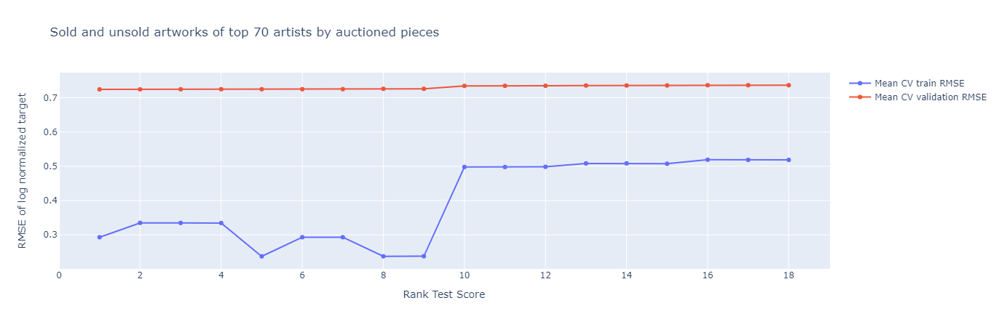

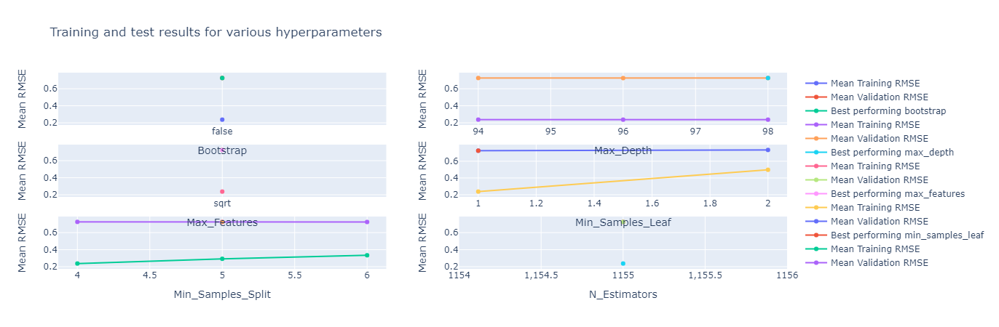

In [61]:
# Run single parameter
params_grid = {'n_estimators': [1155], 'min_samples_split': [4,5,6], 'min_samples_leaf': [1,2], 'max_features': ['sqrt'], 'max_depth': [94,96,98], 'bootstrap': [False]}

pprint(params_grid)

rf_model, rf_results, rf_best_params, rf_best_estimator, rf_feature_importance = perform_tuning(df_train=df_train,
                                                                                                     df_test=df_test,
                                                                                                     model=RandomForestRegressor(),
                                                                                                     params=params_grid,
                                                                                                     cv=skf,
                                                                                                     n_iter = 50,
                                                                                                     list_features_drop=list_features_drop,
                                                                                                     target_col=target_col,
                                                                                                     type_search='Grid',
                                                                                                     return_importance=True,
                                                                                                     return_coeffs=False,
                                                                                                     seed=SEED,
                                                                                                     y_log_transformed=log_transform,
                                                                                                     suppress_graph=False,
                                                                                                     subplots=True)

## Lasso Regression

### Grid Search

In [62]:
#Create list of alphas (steadily increasing by 7.5%)
alpha = 0.005
count=0
list_alpha = []
while count < 50:
    list_alpha.append(alpha)
    alpha += alpha*0.075
    count += 1

{'alpha': [0.005, 0.0053750000000000004, 0.005778125, 0.006211484375, 0.006677345703125, 0.007178146630859375, 0.007716507628173828, 0.008295245700286865, 0.00891738912780838, 0.009586193312394008, 0.010305157810823558, 0.011078044646635326, 0.011908897995132974, 0.012802065344767946, 0.013762220245625543, 0.014794386764047459, 0.015903965771351017, 0.017096763204202343, 0.01837902044451752, 0.019757446977856332, 0.021239255501195556, 0.022832199663785222, 0.024544614638569114, 0.026385460736461797, 0.02836437029169643, 0.030491698063573665, 0.03277857541834169, 0.035236968574717316, 0.03787974121782112, 0.0407207218091577, 0.04377477594484453, 0.04705788414070787, 0.05058722545126096, 0.05438126736010553, 0.05845986241211345, 0.06284435209302196, 0.06755767849999861, 0.0726245043874985, 0.07807134221656088, 0.08392669288280295, 0.09022119484901317, 0.09698778446268916, 0.10426186829739084, 0.11208150841969515, 0.12048762155117229, 0.1295241931675102, 0.13923850765507348, 0.14968139572

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed:    1.4s


--- Best Model predictions (note: predictions were "untransformed" before calculation of RMSE---
Training set RMSE: 207.29740438283213
Test set RMSE: 272.6287314646086

------------------------------ Auctioneer's estimated prices-------------------------------
Training set RMSE: 220.31705609946167
Test set RMSE: 269.8273144545964


[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:    1.7s finished


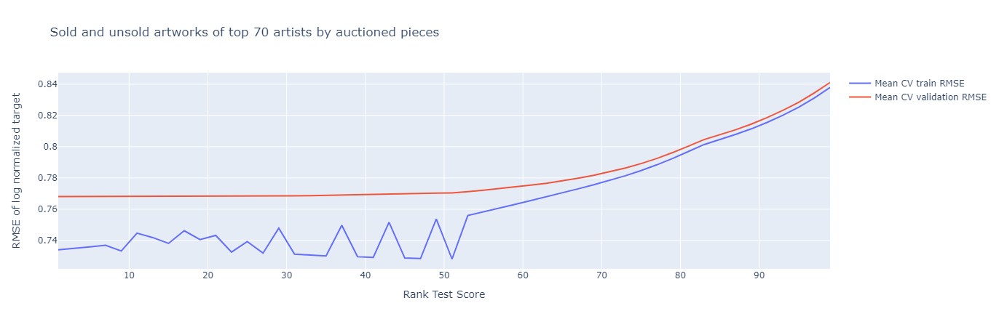

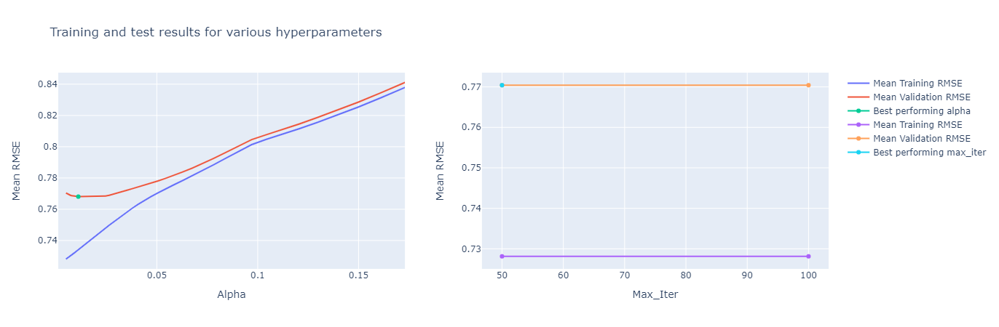

In [63]:
params_grid = {'alpha': list_alpha,
               'max_iter' : [50,100],
              }
print(params_grid)

lasso_model, lasso_results, lasso_best_params, lasso_best_estimator, lasso_feature_coefs = perform_tuning(df_train=df_train,
                                                                                                     df_test=df_test,
                                                                                                     model=Lasso(),
                                                                                                     params=params_grid,
                                                                                                     cv=skf,
                                                                                                     list_features_drop=list_features_drop,
                                                                                                     target_col=target_col,
                                                                                                     type_search='Grid',
                                                                                                     return_importance=False,
                                                                                                     return_coeffs=True,
                                                                                                     seed=SEED,
                                                                                                     y_log_transformed=log_transform,
                                                                                                     subplots=True)

--- Best Model predictions (note: predictions were "untransformed" before calculation of RMSE---
Training set RMSE: 205.87352266009307
Test set RMSE: 271.72439000340603

------------------------------ Auctioneer's estimated prices-------------------------------
Training set RMSE: 220.31705609946167
Test set RMSE: 269.8273144545964

## Ridge Regression - Grid Search

In [64]:
#Create list of alphas (steadily increasing by 7.5%)
alpha = 0.1
count=0
list_alpha = []
while count < 120:
    list_alpha.append(alpha)
    alpha += alpha*0.075
    count += 1

In [65]:
# Number of trees in random forest
#list_alpha = [0.1,1,10,100,200,300,400,500,600,700,800,900,1000,2000]
# Create the grid
params_grid = {'alpha': list_alpha,
              }
print(params_grid)

{'alpha': [0.1, 0.10750000000000001, 0.11556250000000001, 0.12422968750000002, 0.13354691406250002, 0.14356293261718753, 0.1543301525634766, 0.16590491400573734, 0.17834778255616765, 0.19172386624788024, 0.20610315621647124, 0.2215608929327066, 0.23817795990265958, 0.25604130689535903, 0.27524440491251095, 0.29588773528094925, 0.31807931542702045, 0.34193526408404695, 0.3675804088903505, 0.39514893955712677, 0.4247851100239113, 0.45664399327570465, 0.4908922927713825, 0.5277092147292362, 0.5672874058339289, 0.6098339612714736, 0.6555715083668341, 0.7047393714943466, 0.7575948243564227, 0.8144144361831543, 0.8754955188968909, 0.9411576828141577, 1.0117445090252195, 1.087625347202111, 1.1691972482422692, 1.2568870418604394, 1.3511535699999724, 1.4524900877499702, 1.561426844331218, 1.6785338576560593, 1.8044238969802637, 1.9397556892537835, 2.085237365947817, 2.2416301683939035, 2.4097524310234464, 2.590483863350205, 2.78477015310147, 2.9936279145840805, 3.2181500081778864, 3.45951125879

Fitting 5 folds for each of 120 candidates, totalling 600 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 563 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-1)]: Done 600 out of 600 | elapsed:    1.6s finished


--- Best Model predictions (note: predictions were "untransformed" before calculation of RMSE---
Training set RMSE: 206.21100846401498
Test set RMSE: 271.66788483428496

------------------------------ Auctioneer's estimated prices-------------------------------
Training set RMSE: 220.31705609946167
Test set RMSE: 269.8273144545964


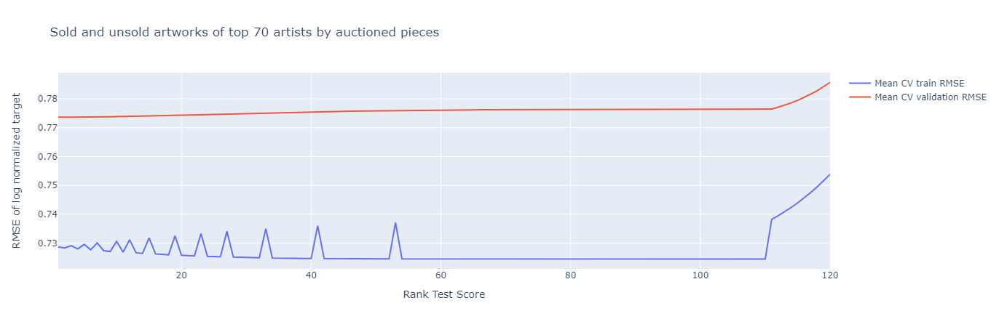

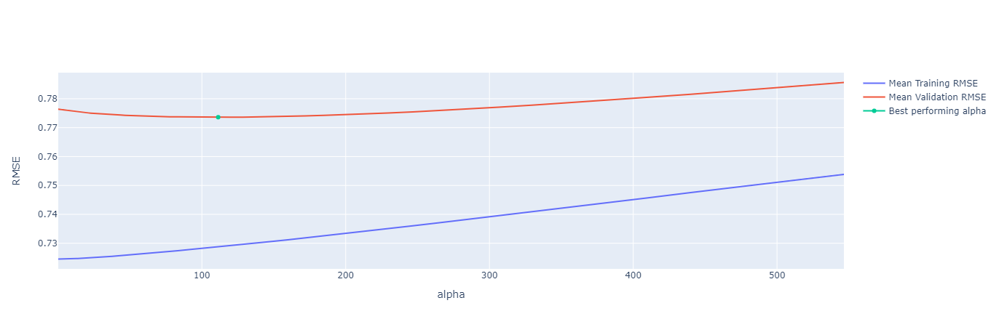

In [66]:
ridge_model, ridge_results, ridge_best_params, ridge_best_estimator, ridge_feature_coeffs = perform_tuning(df_train=df_train,
                                                                                                     df_test=df_test,
                                                                                                     model=Ridge(),
                                                                                                     params=params_grid,
                                                                                                     cv=skf,
                                                                                                     list_features_drop=list_features_drop,
                                                                                                     target_col=target_col,
                                                                                                     type_search='Grid',
                                                                                                     return_importance=False,
                                                                                                     return_coeffs=True,
                                                                                                     seed=SEED,
                                                                                                     y_log_transformed=log_transform,
                                                                                                     subplots=True)

## XGBoost

### Randomized Search

{'alpha': [0, 0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1, 1.5, 2, 2.5, 3, 5],
 'booster': ['gbtree', 'gblinear'],
 'colsample_bytree': [0.6, 0.8, 1.0],
 'gamma': [0.5, 1, 1.5, 2, 5],
 'lambda': [0, 0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1, 1.5, 2, 2.5, 3, 5],
 'max_depth': [3, 4, 5, 6],
 'min_child_weight': [1, 3, 5, 7, 10],
 'subsample': [0.6, 0.8, 1.0]}
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:    6.0s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   12.4s
[Parallel(n_jobs=-1)]: Done 500 out of 500 | elapsed:   18.4s finished


[15:49:04] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
--- Best Model predictions (note: predictions were "untransformed" before calculation of RMSE---
Training set RMSE: 191.14984666295948
Test set RMSE: 266.0528451658706

------------------------------ Auctioneer's estimated prices-------------------------------
Training set RMSE: 220.31705609946167
Test set RMSE: 269.8273144545964


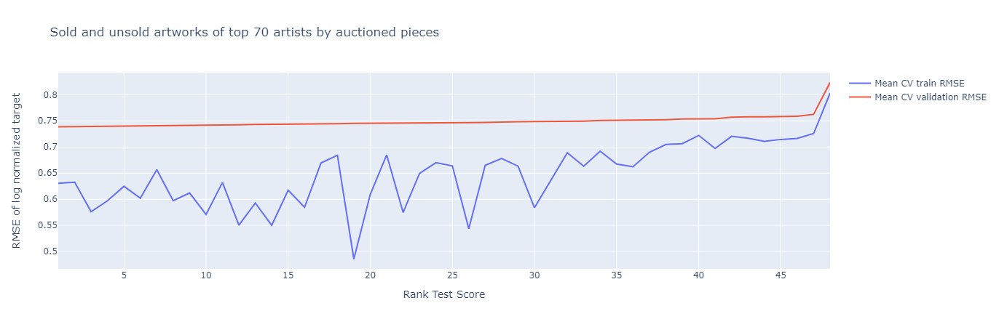

In [67]:
# A parameter grid for XGBoost
params_tree = {
        'min_child_weight': [1, 3, 5, 7, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5, 6],
        'lambda': [0,0.01,0.02,0.05,0.1,0.2,0.5,1,1.5,2,2.5,3,5],
        'alpha': [0,0.01,0.02,0.05,0.1,0.2,0.5,1,1.5,2,2.5,3,5],
        'booster':['gbtree','gblinear']
        }
pprint(params_tree)
param_iter = 100
xgb_model, xgb_results, xgb_best_params, xgb_best_estimator, xgb_feature_importance = perform_tuning(df_train=df_train,
                                                                                                     df_test=df_test,
                                                                                                     model=XGBRegressor(),
                                                                                                     params=params_tree,
                                                                                                     cv=skf,
                                                                                                     list_features_drop=list_features_drop,
                                                                                                     target_col=target_col,
                                                                                                     type_search='random',
                                                                                                     return_importance=True,
                                                                                                     return_coeffs=False,
                                                                                                     seed=SEED,
                                                                                                     y_log_transformed=log_transform,
                                                                                                     subplots=False)

--- Best Model predictions (note: predictions were "untransformed" before calculation of RMSE---
Training set RMSE: 181.4663003487514
Test set RMSE: 264.836661976068

------------------------------ Auctioneer's estimated prices-------------------------------
Training set RMSE: 220.31705609946167
Test set RMSE: 269.8273144545964

__Even with the reduced feature space, overfitting is apparent on XGBoost (as well as other models) but it's still the best performing model.__

Feature selection based on mutual information was able to produce improved performances.

Without further reducing the number of features, the best solution would be to add more data to the dataset. This will allow the model to generalize better.

## Results Analysis

In [68]:
if log_transform:
    #Create a DataFrame with the true values, auction house estimates and models' predictions
    df_pred = pd.DataFrame((np.exp(df_test[target_col])))
    df_pred['Estimated Price - Auctioneer'] = df_test['Estimated Price']
    df_pred['Baseline'] = np.ones((y_true_test.shape[0],))*np.exp(baseline_mean)
    df_pred['Random Forest'] = np.exp(rf_best_estimator.predict(df_test.drop(list_features_drop+[target_col],axis=1)))
    df_pred['Lasso'] = np.exp(lasso_best_estimator.predict(df_test.drop(list_features_drop+[target_col],axis=1)))
    df_pred['Ridge'] = np.exp(ridge_best_estimator.predict(df_test.drop(list_features_drop+[target_col],axis=1)))
    df_pred['XGBoost'] = np.exp(xgb_best_estimator.predict(df_test.drop(list_features_drop+[target_col],axis=1)))   
else:
    #Create a DataFrame with the true values, auction house estimates and models' predictions
    df_pred = pd.DataFrame(((df_test[target_col])))
    df_pred['Estimated Price - Auctioneer'] = df_test['Estimated Price']
    df_pred['Baseline'] = np.ones((y_true_test.shape[0],))*baseline_mean
    df_pred['Random Forest'] = rf_best_estimator.predict(df_test.drop(list_features_drop+[target_col],axis=1))
    df_pred['Lasso'] = lasso_best_estimator.predict(df_test.drop(list_features_drop+[target_col],axis=1))
    df_pred['Ridge'] = ridge_best_estimator.predict(df_test.drop(list_features_drop+[target_col],axis=1))
    df_pred['XGBoost'] = xgb_best_estimator.predict(df_test.drop(list_features_drop+[target_col],axis=1))

### Residuals Plot

There are 245 predictions with negative residuals.
There are 236 predictions with positive residuals.


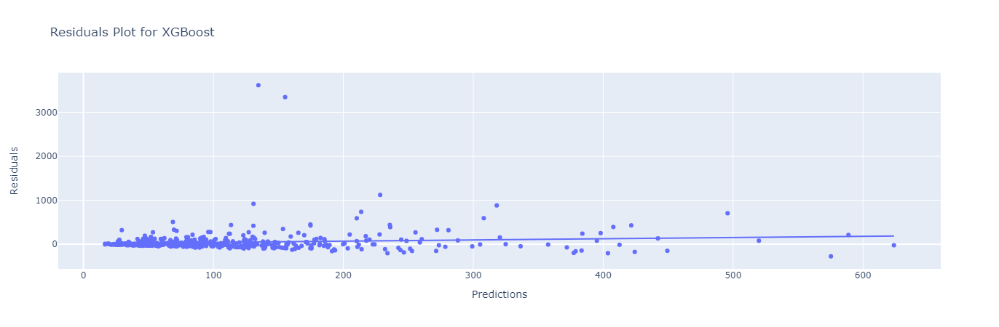

In [69]:
#Calculate the residuals for the best performing model (XGBoost)
residuals = df_pred['Final Price'] - df_pred['XGBoost']

print('There are {} predictions with negative residuals.'.format(residuals[residuals < 0].shape[0]))
print('There are {} predictions with positive residuals.'.format(residuals[residuals > 0].shape[0]))

#Scatterplot of area and sale price
fig = px.scatter(data_frame=df_pred,x=df_pred['XGBoost'].values,y=residuals,title='Residuals Plot for XGBoost', trendline="ols")
fig.update_xaxes(title_text="Predictions")
fig.update_yaxes(title_text="Residuals")
fig.show()

Very very slight positive slope can be detected on the residuals and is similar to the auctioneer predictions.

Most values seem to display negative residual values however. No unbalance is apparent between negative and positive residuals.

A few outliers are apparent.

Residual plot appears reasonable.

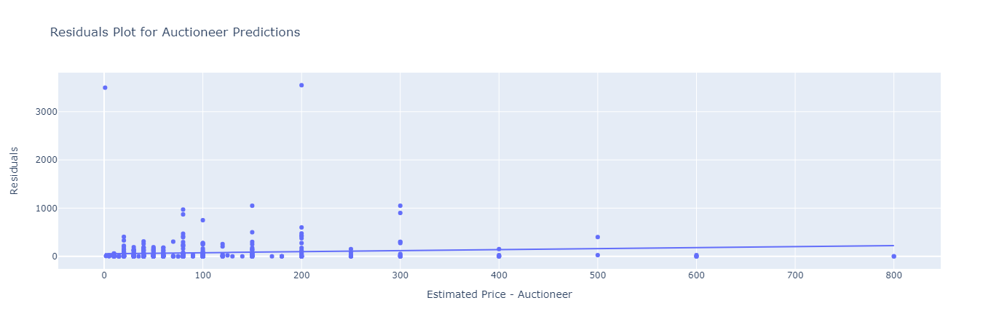

In [70]:
#Calculate the residuals for the best performing model (XGBoost)
residuals = df_pred['Final Price'] - df_pred['Estimated Price - Auctioneer']

#Scatterplot of area and sale price
fig = px.scatter(data_frame=df_pred,x='Estimated Price - Auctioneer',y=residuals,title='Residuals Plot for Auctioneer Predictions', trendline="ols")
fig.update_yaxes(title_text="Residuals")
fig.show()

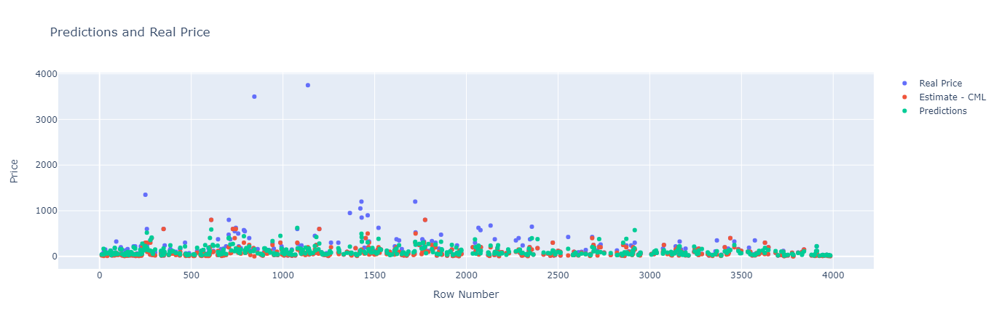

In [71]:
fig = go.Figure(data=[
    go.Scatter(name='Real Price', x=df_pred.index, y=df_pred['Final Price'],mode='markers'),
    go.Scatter(name='Estimate - CML', x=df_pred.index, y=df_pred['Estimated Price - Auctioneer'],mode='markers'),
    go.Scatter(name='Predictions', x=df_pred.index, y=df_pred['XGBoost'],mode='markers'),],
    layout=go.Layout(
        title=go.layout.Title(text="Predictions and Real Price")
    )
)
# Change the bar mode
fig.update_layout(hovermode="x unified")
fig.update_xaxes(title_text="Row Number")
fig.update_yaxes(title_text="Price")
fig.show()

The model still needs further improving if performance is to become acceptable. 

A positive takeaway is that it was able to outperform the Baseline and closely match the Auctioneer's predictions.

# Next Steps

To improve the performance, further data is required, to reduce the tendency to overfit that the models a exibiting.

Further exploration should be done to the data, for example, can we extract interesting information from Clustering techniques?

Exploration and elimination of outliers has also not been executed as of yet.

Finally, the painting image itself is likely a valuable source of information. Can we train a Neural Network to take the image as well as the painting "metadata" to obtain more accurate predictions? Due to the small size of the dataset, transfer learning should be leveraged to ensure that such an approach is feasible.